# datashader

[datashader](https://github.com/bokeh/datashader/) plots huge volume of data.

[documentation](https://github.com/bokeh/datashader/) [source](https://github.com/bokeh/datashader/) [tutorial](https://github.com/bokeh/datashader/blob/master/examples/) 

In [1]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

In [2]:
import bokeh.plotting as bp
bp.output_notebook()

Loading BokehJS ...

## short example

from [trajectory.ipynb](https://github.com/bokeh/datashader/blob/master/examples/trajectory.ipynb)

In [3]:
import pandas as pd
import numpy as np
import xarray as xr
# On Windows, you must run the notebook with admin right
# otherwise the following instruction does not end.
import datashader
import datashader as ds
import datashader.transfer_functions as tf

In [4]:
# Constants
np.random.seed(1)
n = 1000000 # Number of points
f = filter_width = 5000 # momentum or smoothing parameter, for a moving average filter

# filtered random walk
xs = np.convolve(np.random.normal(0, 0.1, size=n), np.ones(f)/f).cumsum()
ys = np.convolve(np.random.normal(0, 0.1, size=n), np.ones(f)/f).cumsum()

# Add "mechanical" wobble on the x axis
xs += 0.1*np.sin(0.1*np.array(range(n-1+f)))

# Add "measurement" noise
xs += np.random.normal(0, 0.005, size=n-1+f)
ys += np.random.normal(0, 0.005, size=n-1+f)

# Add a completely incorrect value
xs[int(len(xs)/2)] = 100
ys[int(len(xs)/2)] = 0

# Create a dataframe
df = pd.DataFrame(dict(x=xs,y=ys))

# Default plot ranges:
x_range = (xs.min(), xs.max())
y_range = (ys.min(), ys.max())

df.tail()

,x,y
1004994,65.164829,-105.064056
1004995,65.177603,-105.069781
1004996,65.190898,-105.071699
1004997,65.194054,-105.054657
1004998,65.204752,-105.073366


In [5]:
def create_image(x_range=x_range, y_range=y_range, w=500, h=500):
    cvs = ds.Canvas(x_range=x_range, y_range=y_range, plot_height=h, plot_width=w)
    agg = cvs.line(df, 'x', 'y', agg=ds.any())
    return tf.shade(agg)

Wall time: 651 ms


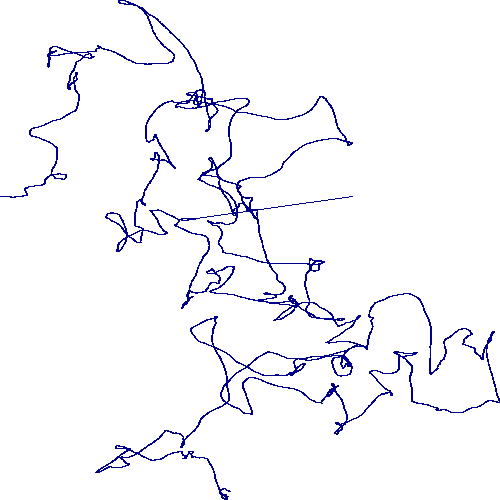

In [6]:
%time create_image()

In [7]:
from datashader.bokeh_ext import InteractiveImage
import bokeh.plotting as bp


def base_plot(tools='pan,wheel_zoom,reset'):
    p = bp.figure(tools=tools, plot_width=500, plot_height=500,
        x_range=x_range, y_range=y_range, outline_line_color=None,
        min_border=0, min_border_left=0, min_border_right=0,
        min_border_top=0, min_border_bottom=0)   
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    return p

p = base_plot()
InteractiveImage(p, create_image)

## NYC taxi

[NYC taxi](http://www.nyc.gov/html/tlc/html/about/trip_record_data.shtml)

### without datashader

In [8]:
import pandas as pd
import os
if os.path.exists('green_tripdata_2015-12.csv'):
    df = pd.read_csv('green_tripdata_2015-12.csv',
                           usecols=['Pickup_longitude', 'Pickup_latitude',
                                    'Dropoff_longitude', 'Dropoff_latitude',
                                    'Passenger_count'])
    df = df [(df.Dropoff_longitude < -10) & (df.Pickup_longitude < -10)]
    df.sample(100000).to_csv("green_tripdata_2015-12_sample.csv")
else:
    df = pd.read_csv("green_tripdata_2015-12_sample.csv")
df.tail()

,Unnamed: 0,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count
99995,1505945,-73.916512,40.777092,-74.008743,40.704510,2
99996,968290,-73.830383,40.759563,-73.820259,40.751740,1
99997,1274687,-73.899574,40.746056,-73.899651,40.746105,2
99998,1023243,-73.948578,40.789158,-73.957741,40.776196,1
99999,261195,-73.943939,40.711861,-73.994743,40.684658,1


In [9]:
samples = df.sample(n=1000)
samples.head()

,Unnamed: 0,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count
21828,824149,-73.937645,40.679783,-73.973488,40.680565,1
43531,622111,-73.899452,40.743587,-73.882927,40.741615,5
63837,291124,-73.922501,40.708939,-73.956100,40.688629,1
8116,1516644,-73.995628,40.686577,-73.986610,40.680191,1
73979,1283648,-73.840294,40.695374,-73.824905,40.706371,1


In [10]:
samples.describe()

,Unnamed: 0,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count
count,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,8.017301e+05,-73.934097,40.745278,-73.931417,40.741332,1.322000
std,4.551613e+05,0.044140,0.055953,0.051746,0.057068,0.946156
min,1.376000e+03,-74.026848,40.587414,-74.030685,40.578484,1.000000
25%,4.124792e+05,-73.960981,40.694023,-73.965458,40.692575,1.000000
50%,8.012435e+05,-73.945271,40.742716,-73.944492,40.742437,1.000000
75%,1.206654e+06,-73.914671,40.799161,-73.904083,40.781639,1.000000
max,1.608100e+06,-73.776367,40.887508,-73.722435,40.909649,6.000000


In [11]:
from bokeh.plotting import figure, output_notebook, show
x_range=(samples.Dropoff_longitude.min(), samples.Dropoff_longitude.max())
y_range=(samples.Dropoff_latitude.min(), samples.Dropoff_latitude.max())

def base_plot(tools='pan,wheel_zoom,reset',plot_width=900, plot_height=600, **plot_args):
    p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
        x_range=x_range, y_range=y_range, outline_line_color=None,
        min_border=0, min_border_left=0, min_border_right=0,
        min_border_top=0, min_border_bottom=0, **plot_args)
    
    p.axis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    return p

In [12]:
from bokeh.tile_providers import STAMEN_TERRAIN

p = base_plot()
p.add_tile(STAMEN_TERRAIN)
options = dict(line_color=None, fill_color='blue', size=5)
p.circle(x=samples['Dropoff_longitude'], y=samples['Dropoff_latitude'], **options)
show(p)

In [13]:
samples = df.sample(n=10000)
p = base_plot()

p.circle(x=samples['Dropoff_longitude'], y=samples['Dropoff_latitude'], **options)
show(p)

In [14]:
options = dict(line_color=None, fill_color='blue', size=1, alpha=0.1)
samples = df.sample(n=100000)
p = base_plot()
p.circle(x=samples['Dropoff_longitude'], y=samples['Dropoff_latitude'], **options)
show(p)

### with datashader

See [taxi.ipynb](https://github.com/bokeh/datashader/blob/master/examples/nyc_taxi.ipynb). This part should be run with a bigger sample than the previous one.

In [15]:
import pandas as pd
import os
if os.path.exists('green_tripdata_2015-12.csv'):
    df = pd.read_csv('green_tripdata_2015-12.csv',
                           usecols=['pickup_x', 'pickup_y', 'dropoff_x', 'dropoff_y', 
                                    'passenger_count', 'tpep_pickup_datetime'])
    df = df [(df.dropoff_x < -10) & (df.dropoff_y < -10)]
    df.sample(100000).to_csv("green_tripdata_2015-12_sample.csv")
else:
    df = pd.read_csv("green_tripdata_2015-12_sample.csv")
    df.columns = ['?', 'pickup_x', 'pickup_y', 'dropoff_x', 'dropoff_y', 
                                    'passenger_count']
df.tail()

,?,pickup_x,pickup_y,dropoff_x,dropoff_y,passenger_count
99995,1505945,-73.916512,40.777092,-74.008743,40.704510,2
99996,968290,-73.830383,40.759563,-73.820259,40.751740,1
99997,1274687,-73.899574,40.746056,-73.899651,40.746105,2
99998,1023243,-73.948578,40.789158,-73.957741,40.776196,1
99999,261195,-73.943939,40.711861,-73.994743,40.684658,1


In [16]:
import datashader as ds
from datashader import transfer_functions as tf
from datashader.colors import Greys9
Greys9_r = list(reversed(Greys9))[:-2]

In [17]:
plot_width  = int(750)
plot_height = int(plot_width//1.2)

In [18]:
cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height, x_range=x_range, y_range=y_range)
agg = cvs.points(df, 'dropoff_x', 'dropoff_y',  ds.count('passenger_count'))
img = tf.shade(agg, cmap=["white", 'darkblue'], how='linear')

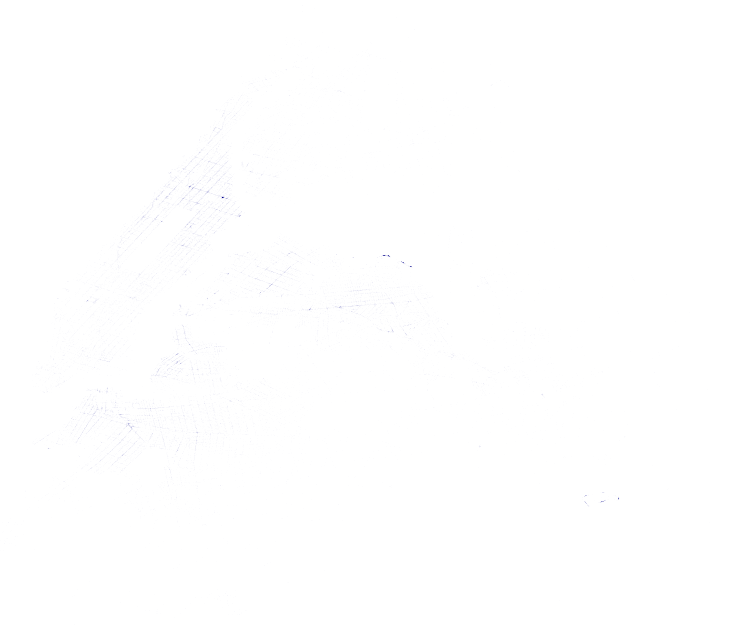

In [19]:
img

In [20]:
import numpy as np

def histogram(x,colors=None):
    hist,edges = np.histogram(x, bins=100)
    p = figure(y_axis_label="Pixels",
               tools='', height=130, outline_line_color=None,
               min_border=0, min_border_left=0, min_border_right=0,
               min_border_top=0, min_border_bottom=0)
    p.quad(top=hist[1:], bottom=0, left=edges[1:-1], right=edges[2:])
    print("min: {}, max: {}".format(np.min(x),np.max(x)))
    show(p)

In [21]:
histogram(agg.values)

min: 0, max: 175


min: 0.0, max: 5.170483995038151


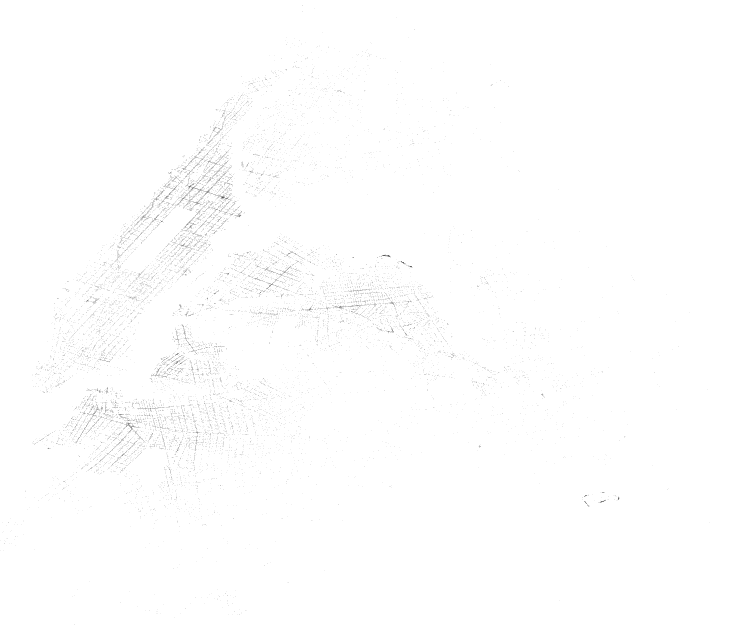

In [22]:
histogram(np.log1p(agg.values))

tf.shade(agg, cmap=Greys9_r, how='log')

In [23]:
NYC = x_range, y_range = ((-8242000,-8210000), (4965000,4990000))

In [24]:
import datashader as ds
from datashader.bokeh_ext import InteractiveImage
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9, Hot, viridis, inferno
from IPython.core.display import HTML, display

background = "black"
export = partial(export_image, export_path="export", background=background)
cm = partial(colormap_select, reverse=(background=="black"))

def create_image(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'dropoff_x', 'dropoff_y',  ds.count('passenger_count'))
    img = tf.shade(agg, cmap=Hot, how='eq_hist')
    return tf.dynspread(img, threshold=0.5, max_px=4)

p = base_plot(background_fill_color=background)
export(create_image(*NYC),"NYCT_hot")
InteractiveImage(p, create_image)

In [25]:
import numpy as np
from functools import partial

def create_image90(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'dropoff_x', 'dropoff_y',  ds.count('passenger_count'))
    img = tf.shade(agg #.where(agg>np.percentile(agg,90))  # already a sample and it removes too many rows
                   , cmap=inferno, how='eq_hist')
    return tf.dynspread(img, threshold=0.3, max_px=4)
    
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
export(create_image(*NYC),"NYCT_90th")
InteractiveImage(p, create_image90)

In [26]:
def merged_images(x_range, y_range, w=plot_width, h=plot_height, how='log'):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    picks = cvs.points(df, 'pickup_x', 'pickup_y',  ds.count('passenger_count'))
    drops = cvs.points(df, 'dropoff_x', 'dropoff_y', ds.count('passenger_count'))
    # already a sample and the following filter removes too many rows,
    # you should use a bigger sample
    more_drops = tf.shade(drops # .where(drops > picks)
                          , cmap=["darkblue", 'cornflowerblue'], how=how)
    more_picks = tf.shade(picks # .where(picks > drops)
                          , cmap=["darkred", 'orangered'],  how=how)
    img = tf.stack(more_picks,more_drops)
    return tf.dynspread(img, threshold=0.3, max_px=4)

p = base_plot(background_fill_color=background)
export(merged_images(*NYC),"NYCT_pickups_vs_dropoffs")
InteractiveImage(p, merged_images)